In [1]:
# import tensorflow as tf

# # Set TensorFlow to only allocate memory as needed
# gpus = tf.config.experimental.list_physical_devices('GPU')
# if gpus:
#     try:
#         for gpu in gpus:
#             tf.config.experimental.set_memory_growth(gpu, True)
#     except RuntimeError as e:
#         print(e)


In [2]:
import numpy as np 
import pandas as pd 
import os
import gc
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_addons as tfa

# Display
from IPython.display import Image, display
import matplotlib.pyplot as plt
import matplotlib.cm as cm


AUTOTUNE = tf.data.experimental.AUTOTUNE

In [3]:
import pandas as pd
import numpy as np
import tensorflow as tf
import tensorflow_addons as tfa
import glob, warnings
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

warnings.filterwarnings('ignore')
print('TensorFlow Version ' + tf.__version__)

TensorFlow Version 2.7.0


In [4]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
from PIL import Image
np.random.seed(123)

In [5]:
path_list_1 = glob('D:/SEM-5/Skin Cancer Grad/archive(3)/HAM10000_images_part_1/*.jpg')
path_list_2 = glob('D:/SEM-5/Skin Cancer Grad/archive(3)/HAM10000_images_part_2/*.jpg')

In [6]:
path_list=path_list_1+path_list_2
len(path_list)

10015

In [7]:
imageid_path_dict = {}
for x in path_list:
    imageid_path_dict[os.path.splitext(os.path.basename(x))[0]] = x;

In [8]:
lesion_type_dict = {
    'nv': 'Melanocytic nevi',
    'mel': 'Melanoma',
    'bkl': 'Benign keratosis-like lesions ',
    'bcc': 'Basal cell carcinoma',
    'akiec': 'Actinic keratoses',
    'vasc': 'Vascular lesions',
    'df': 'Dermatofibroma'
}

In [9]:
skin_df = pd.read_csv('D:/SEM-5/Skin Cancer Grad/archive(3)/HAM10000_metadata.csv')
skin_df['path'] = skin_df['image_id'].map(imageid_path_dict.get)
skin_df['cell_type'] = skin_df['dx'].map(lesion_type_dict.get) 
skin_df['cell_type_idx'] = pd.Categorical(skin_df['cell_type']).codes

In [10]:
skin_df['lesion_id'].unique().shape

(7470,)

In [11]:
skin_df = skin_df.drop_duplicates(subset='lesion_id')

In [12]:
skin_df.isnull().sum()

lesion_id         0
image_id          0
dx                0
dx_type           0
age              52
sex               0
localization      0
path              0
cell_type         0
cell_type_idx     0
dtype: int64

In [13]:
skin_df['age'].fillna((skin_df['age'].mean()), inplace=True)

In [14]:
skin_df.isnull().sum()

lesion_id        0
image_id         0
dx               0
dx_type          0
age              0
sex              0
localization     0
path             0
cell_type        0
cell_type_idx    0
dtype: int64

In [15]:
# skin_df['image'] = skin_df['path'].map(lambda x: np.asarray(Image.open(x).resize((256, 256))))

In [16]:
# skin_df['image'].map(lambda x: x.shape).value_counts()

In [17]:
skin_df = skin_df.drop('lesion_id', axis=1).drop('image_id', axis=1).drop('dx_type', axis=1).\
        drop('age', axis=1).drop('sex', axis=1).drop('localization', axis=1).\
        drop('cell_type', axis=1).drop('cell_type_idx', axis=1)

In [18]:
skin_df = skin_df[(skin_df.dx == 'mel') | (skin_df.dx == 'nv')]

In [19]:
skin_df['id'] = skin_df.pop('dx')

In [20]:
skin_df

,path,id
64,D:/SEM-5/Skin Cancer Grad/archive(3)/HAM10000_...,nv
1210,D:/SEM-5/Skin Cancer Grad/archive(3)/HAM10000_...,nv
1211,D:/SEM-5/Skin Cancer Grad/archive(3)/HAM10000_...,mel
1213,D:/SEM-5/Skin Cancer Grad/archive(3)/HAM10000_...,mel
1214,D:/SEM-5/Skin Cancer Grad/archive(3)/HAM10000_...,mel
...,...,...
9675,D:/SEM-5/Skin Cancer Grad/archive(3)/HAM10000_...,nv
9677,D:/SEM-5/Skin Cancer Grad/archive(3)/HAM10000_...,nv
9678,D:/SEM-5/Skin Cancer Grad/archive(3)/HAM10000_...,nv
9683,D:/SEM-5/Skin Cancer Grad/archive(3)/HAM10000_...,nv


In [21]:
# Import label encoder
from sklearn import preprocessing
  
# label_encoder object knows how to understand word labels.
label_encoder = preprocessing.LabelEncoder()
  
# Encode labels in column 'species'.
skin_df['id']= label_encoder.fit_transform(skin_df['id'])

# nv=1
# mel=0

In [22]:
skin_df = skin_df.reset_index()
skin_df = skin_df.drop('index', axis=1)

MEL 0: 614
NV  1: 5403
Proportion: 0.11 : 1


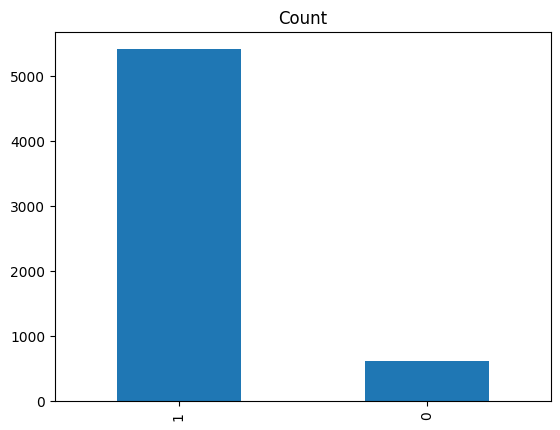

In [23]:
count = skin_df.id.value_counts()
print('MEL 0:', count[0])
print('NV  1:', count[1])
print('Proportion:', round(count[0] / count[1], 2), ': 1')

count.plot(kind='bar', title='Count');

In [24]:
num_images=skin_df['path'].shape
num_images

(6017,)

In [25]:
# Class count
count_class_1, count_class_0 = skin_df.id.value_counts()

# Divide by class
df_class_0 = skin_df[skin_df['id'] == 0]
df_class_1 = skin_df[skin_df['id'] == 1]

# df_class_0=df_class_0.drop(columns="Unnamed: 0")
# df_class_1=df_class_1.drop(columns="Unnamed: 0")

Random over-sampling:
1    614
0    614
Name: id, dtype: int64


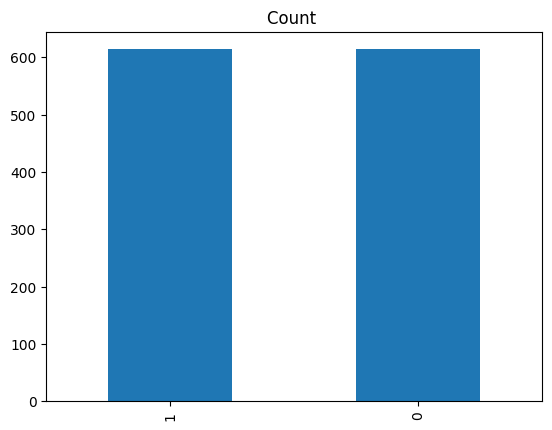

In [26]:
# Random over-sampling
df_class_0_over = df_class_0
df_class_1_under = df_class_1.sample(614, replace=True)

df_over_sampling = pd.concat([df_class_1_under, df_class_0_over],  ignore_index=True,axis=0)

print('Random over-sampling:')
print(df_over_sampling.id.value_counts())

df_over_sampling.id.value_counts().plot(kind='bar', title='Count ');

In [27]:
# Store number of images in the dataset
num_images = df_over_sampling.shape[0]
num_classes = 2
print(num_images)

1228


In [28]:
# df_over_sampling['image'][0].shape

In [29]:
# Get y, a vector containing the classes for each image
y = df_over_sampling.pop('id')

In [30]:
# Allocate space for all images
X = np.empty((num_images, 256, 256, 3),dtype='uint8')

In [31]:
# for i in range(0, num_images):
      
#     X[i, :, :, :] = np.reshape(df_over_sampling['image'][i], (256, 256, 3)) 

# print(y[:].value_counts())

# print("X.shape =", X.shape)
# print("y.shape =", y.shape)

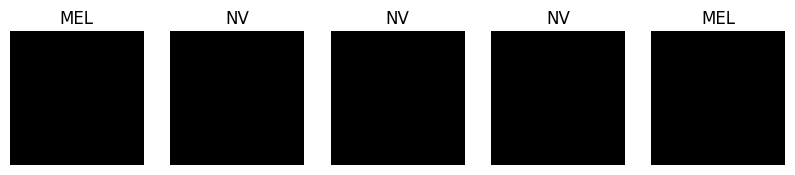

In [32]:
# visualize some images / labels
class_names = ['MEL', 'NV']

W_grid=5
L_grid=1
fig,axes = plt.subplots(L_grid,W_grid,figsize=(10,10))
axes=axes.ravel()
n_training=len(X)
for i in np.arange(0,L_grid * W_grid):
    index=np.random.randint(0,n_training) #Pick a random number 
    axes[i].imshow(X[index])
#     print(y_train[index].tolist())
    axes[i].set_title(class_names[y[index]]) #Prints labels on top of the picture
    axes[i].axis('off')
plt.subplots_adjust(hspace=0.4)

In [33]:
import keras
from sklearn.utils import shuffle
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(df_over_sampling['path'],y, test_size=0.10,random_state=28)
x_train, x_val, y_train, y_val = train_test_split(x_train,y_train, test_size=0.112,random_state=28)


print(x_train.shape, y_train.shape)
print(x_test.shape, y_test.shape)
print(x_val.shape, y_val.shape)

(981,) (981,)
(123,) (123,)
(124,) (124,)


In [34]:
from keras.utils import np_utils
n_classes=2
y_train = keras.utils.np_utils.to_categorical(y_train, n_classes)
y_test = keras.utils.np_utils.to_categorical(y_test, n_classes)
y_val = keras.utils.np_utils.to_categorical(y_val , n_classes)

y_train.shape, y_test.shape, y_val.shape

((981, 2), (123, 2), (124, 2))

In [35]:
num_classes = 2
# input_shape = (512, 512, 1)

In [36]:
learning_rate = 1e-4 #0.001
weight_decay = 0.0001
batch_size = 32
num_epochs = 100
# We'll resize input images to this size
image_size =  256 
# Size of the patches to be extract from the input images
patch_size = 20  
num_patches = (image_size // patch_size) ** 2
projection_dim = 128 #64
num_heads = 6 #4
# Size of the transformer layers
transformer_units = [
    projection_dim * 2,
    projection_dim,
]  
transformer_layers = 3 #8
# Size of the dense layers of the final classifier
mlp_head_units = [256] #[1024, 512]  

In [37]:
num_patches

144

In [38]:
@tf.function
def load(image_file, target):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image)
    print(image)

    image_ = tf.cast(image, tf.float32)
    return image_, target

In [39]:
y_train.shape[0]

981

In [40]:
train_loader = (
    tf.data.Dataset
    .from_tensor_slices((x_train,y_train))
    .map(load, num_parallel_calls=AUTOTUNE)
    .shuffle(7)
    .batch(125)
)
val_loader = (
    tf.data.Dataset
    .from_tensor_slices((x_val,y_val))
    .map(load, num_parallel_calls=AUTOTUNE)
    .shuffle(7)
    .batch(batch_size)
)
test_loader = (
    tf.data.Dataset
    .from_tensor_slices((x_test,y_test))
    .map(load, num_parallel_calls=AUTOTUNE)
    .shuffle(7)
    .batch(batch_size)
)

Tensor("DecodeJpeg:0", shape=(None, None, None), dtype=uint8)


In [41]:
train_batch = (
    tf.data.Dataset
    .from_tensor_slices((x_train,y_train))
    .map(load, num_parallel_calls=AUTOTUNE)
    .shuffle(7)
    .batch(x_train.shape[0]-100)
)

In [42]:
data_augmentation = keras.Sequential(
    [
#         layers.experimental.preprocessing.Normalization(),
        layers.experimental.preprocessing.Resizing(image_size, image_size),
        layers.experimental.preprocessing.RandomFlip("horizontal"),
        layers.experimental.preprocessing.RandomRotation(factor=0.02),
#         layers.experimental.preprocessing.RandomZoom(
#             height_factor = 0.2, width_factor = 0.2
#         ),
    ],
     name="data_augmentation",
)
# # Compute the mean and the variance of the training data for normalization.
# CompleteBatchData  =next(iter(train_batch))[0]
# data_augmentation.layers[0].adapt(CompleteBatchData)

In [43]:
# del CompleteBatchData
gc.collect()

6194

In [44]:
def mlp(x, hidden_units, dropout_rate):
    for units in hidden_units:
        x = layers.Dense(units, activation = tf.nn.gelu)(x)
        x = layers.Dropout(dropout_rate)(x)
    return x

In [45]:
class Patches(layers.Layer):
    def __init__(self, patch_size):
        super(Patches, self).__init__()
        self.patch_size = patch_size
        
    def call(self, images):
        batch_size = tf.shape(images)[0]
        patches = tf.image.extract_patches(
            images = images,
            sizes = [1, self.patch_size, self.patch_size, 1],
            strides=[1, self.patch_size, self.patch_size, 1],
            rates=[1, 1, 1, 1],
            padding="VALID",
        )
        patch_dims = patches.shape[-1]
        #print(patches.shape)
        patches = tf.reshape(patches, [batch_size, -1, patch_dims])
        return patches

(450, 600, 3)
(450, 600, 1)
(1, 256, 256, 1)
Image size: 256 X 256
Patch size: 20 X 20
Patches per image: 144
Elements per patch: 400


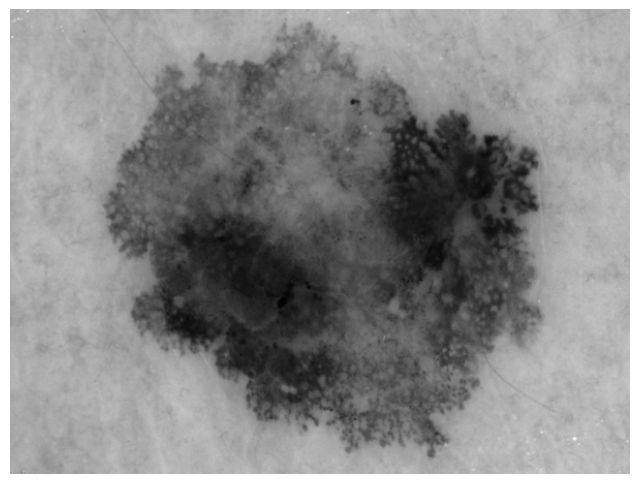

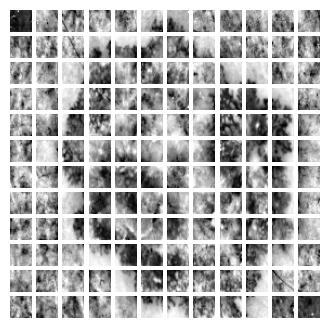

In [46]:
import cv2
from skimage.color import rgb2gray
from numpy import array

plt.figure(figsize=(8, 8))
image = next(iter(train_loader))[0][5]
print(image.shape)
img_gray = rgb2gray(image)
data = img_gray
data = array(data)
image = data.reshape((data.shape[0], data.shape[1], 1))

print(image.shape)


plt.imshow(image, cmap='gray')
plt.axis("off")

resized_image = tf.image.resize(
    tf.convert_to_tensor([image]), size=(image_size, image_size)
)
print(resized_image.shape)
patches = Patches(patch_size)(resized_image)
print(f"Image size: {image_size} X {image_size}")
print(f"Patch size: {patch_size} X {patch_size}")
print(f"Patches per image: {patches.shape[1]}")
print(f"Elements per patch: {patches.shape[-1]}")

n = int(np.sqrt(patches.shape[1]))

plt.figure(figsize=(4, 4))
for i, patch in enumerate(patches[0]):
    ax = plt.subplot(n, n, i + 1)
    patch_img = tf.reshape(patch, (patch_size, patch_size, 1))
    plt.imshow(patch_img,cmap='gray')
    plt.axis("off")

In [47]:
input_shape=(450, 600, 3)

In [48]:
class PatchEncoder(layers.Layer):
    def __init__(self, num_of_patches, projection_dim):
        super(PatchEncoder, self).__init__()
        self.num_patches = num_patches
        self.projection = layers.Dense(units = projection_dim)
        self.position_embedding = layers.Embedding(
            input_dim = num_patches, output_dim = projection_dim
        )
        
    def call(self, patch):
        positions = tf.range(start=0, limit=self.num_patches, delta=1)
        encode = self.projection(patch) + self.position_embedding(positions)
        return encode

In [49]:
def vit_model():
    inputs = layers.Input(shape=input_shape)
    # Augment data.
    augmented = data_augmentation(inputs)
    # Create patches.
    patches = Patches(patch_size)(augmented)
    # Encode patches.
    encoded_patches = PatchEncoder(num_patches, projection_dim)(patches)
    
    # Create multiple layers of the Transformer block.
    for _ in range(transformer_layers):
        # Layer normalization 1.
        x1 = layers.BatchNormalization()(encoded_patches)
        # create a multi-head attention layer
        attention_output = layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=projection_dim, dropout=0.1
        )(x1, x1)
        # Skip connection 1.
        x2 = layers.Add()([attention_output, encoded_patches])
        # Layer normalization 2.
        x3 = layers.BatchNormalization()(x2)
        # MLP.
        x3 = mlp(x3, hidden_units=transformer_units, dropout_rate=0.1)
        # Skip connection 2.
        encoded_patches = layers.Add()([x3, x2])
        
    # Create a [batch_size, projection_dim] tensor.
    representation = layers.LayerNormalization()(encoded_patches)
    representation = layers.Flatten()(representation)
    representation = layers.Dropout(0.5)(representation)
    # Add MLP
    features = mlp(representation, hidden_units = mlp_head_units, dropout_rate=0.5)
    # Classify outputs.
    logits = layers.Dense(num_classes, activation='softmax')(features)
    # create keras model
    model = keras.Model(inputs=inputs, outputs=logits)
    return model

In [50]:
def experiment(model):
    optimizer = tfa.optimizers.AdamW(
        learning_rate=learning_rate, weight_decay=weight_decay
    )
    
    model.compile(
        optimizer=optimizer,
        loss=keras.losses.CategoricalCrossentropy(from_logits=True),
        metrics=[
            keras.metrics.CategoricalAccuracy(name="accuracy"),
            keras.metrics.AUC( name="AUC"),
        ],
     )
    checkpoint_filepath = 'D:/SEM-5/Skin Cancer Grad/checkpoints'
    checkpoint_callback = keras.callbacks.ModelCheckpoint(
        checkpoint_filepath,
        monitor="val_accuracy",
        save_best_only=True,
        save_weights_only=True,
    )

    history = model.fit(train_loader ,
                        batch_size=batch_size,
                        epochs=60,
                        validation_data=val_loader,
                        callbacks=[checkpoint_callback],)
    model.load_weights(checkpoint_filepath)
    _, accuracy, auc = model.evaluate(test_loader)
    print(f"Test accuracy: {round(accuracy * 100, 2)}%")
    print(f"Test AUC: {round(auc * 100, 2)}%")

    return history

In [51]:
vit_classifier = vit_model()
vit_classifier.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 450, 600, 3  0           []                               
                                )]                                                                
                                                                                                  
 data_augmentation (Sequential)  (None, 256, 256, 3)  0          ['input_1[0][0]']                
                                                                                                  
 patches_1 (Patches)            (None, None, 1200)   0           ['data_augmentation[0][0]']      
                                                                                                  
 patch_encoder (PatchEncoder)   (None, 144, 128)     172160      ['patches_1[0][0]']          

In [52]:
history = experiment(vit_classifier)

Epoch 1/60
8/8 [==============================] - 26s 3s/step - loss: 1.7813 - accuracy: 0.5362 - AUC: 0.5346 - val_loss: 0.5890 - val_accuracy: 0.6532 - val_AUC: 0.7594
Epoch 2/60
8/8 [==============================] - 7s 799ms/step - loss: 0.8811 - accuracy: 0.5749 - AUC: 0.6016 - val_loss: 0.6627 - val_accuracy: 0.5565 - val_AUC: 0.6917
Epoch 3/60
8/8 [==============================] - 6s 793ms/step - loss: 0.7301 - accuracy: 0.5576 - AUC: 0.5969 - val_loss: 0.6601 - val_accuracy: 0.4677 - val_AUC: 0.6231
Epoch 4/60
8/8 [==============================] - 6s 795ms/step - loss: 0.6417 - accuracy: 0.6249 - AUC: 0.6793 - val_loss: 0.6552 - val_accuracy: 0.6048 - val_AUC: 0.7233
Epoch 5/60
8/8 [==============================] - 8s 1s/step - loss: 0.6468 - accuracy: 0.6147 - AUC: 0.6644 - val_loss: 0.5940 - val_accuracy: 0.7258 - val_AUC: 0.7977
Epoch 6/60
8/8 [==============================] - 7s 933ms/step - loss: 0.6207 - accuracy: 0.6707 - AUC: 0.7226 - val_loss: 0.5545 - val_accuracy

In [53]:
# # # list all data in history
# print(history.history.keys())
# # summarize history for accuracy
# plt.figure(figsize=(12,10))
# plt.plot(history.history['accuracy'])
# plt.plot(history.history['val_accuracy'])
# plt.title('model accuracy')
# plt.ylabel('accuracy')
# plt.xlabel('epoch')
# plt.legend(['train', 'test'], loc='upper left')
# plt.show()
# # summarize history for loss
# plt.figure(figsize=(12,10))
# plt.plot(history.history['loss'])
# plt.plot(history.history['val_loss'])
# plt.title('model loss')
# plt.ylabel('loss')
# plt.xlabel('epoch')
# plt.legend(['train', 'test'], loc='upper left')
# plt.show()

dict_keys(['loss', 'accuracy', 'AUC', 'val_loss', 'val_accuracy', 'val_AUC'])


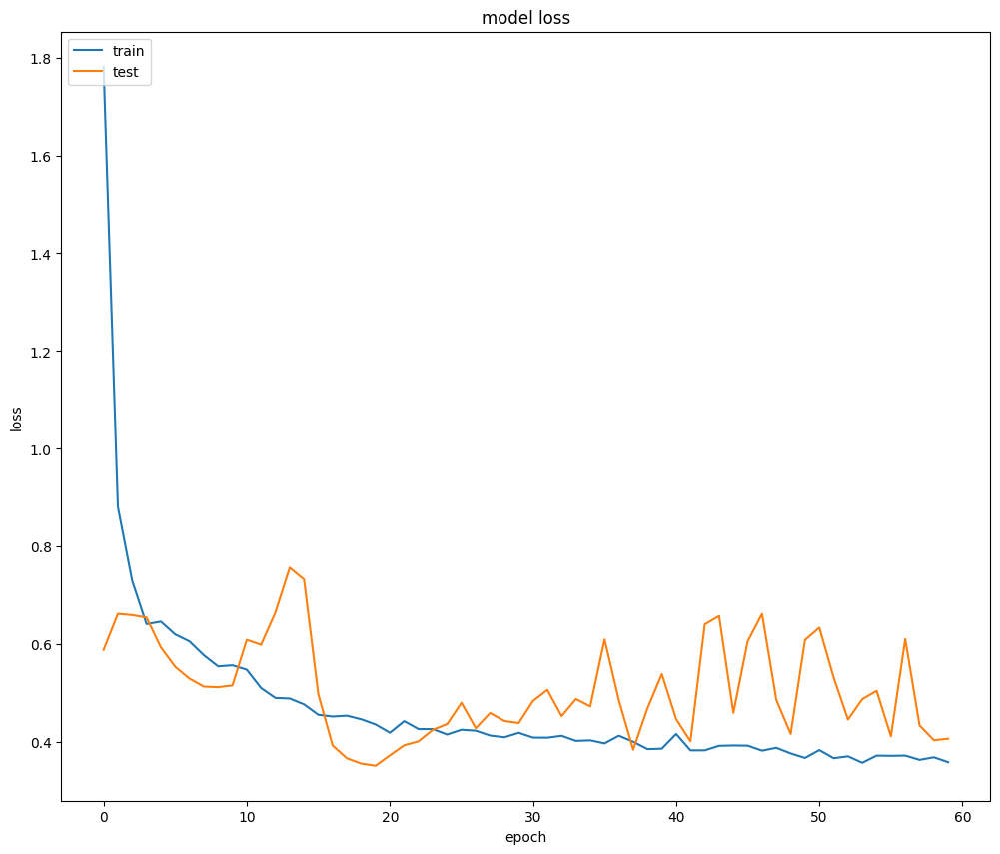

In [54]:
# list all data in history
print(history.history.keys())

# summarize history for loss
plt.figure(figsize=(12,10))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [55]:
# # summarize history for loss
# plt.figure(figsize=(12,10))
# plt.plot(history.history['AUC'])
# plt.plot(history.history['val_AUC'])
# plt.title('model AUC')
# plt.ylabel('AUC')
# plt.xlabel('epoch')
# plt.legend(['train', 'test'], loc='upper left')
# plt.show()

In [56]:
vit_classifier.load_weights('D:/SEM-5/Skin Cancer Grad/checkpoints')

In [57]:
def get_img_array(img):
    
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array

In [58]:
predicted_classes=[]
true_classes=[]
for images,y in zip(next(iter(train_loader))[0],next(iter(train_loader))[1]):
    
#     print(images)
    img_array =get_img_array(images)
    # Remove last layer's softmax
    vit_classifier.layers[-1].activation = None
    # Print what the top predicted class is
    preds = np.argmax(vit_classifier.predict(img_array))
#     print(preds)
    true_classes.append(np.argmax(y))
    predicted_classes.append(preds)   


In [59]:
len(predicted_classes)

125

              precision    recall  f1-score   support

           0       0.56      0.70      0.62        63
           1       0.60      0.45      0.51        62

    accuracy                           0.58       125
   macro avg       0.58      0.58      0.57       125
weighted avg       0.58      0.58      0.57       125



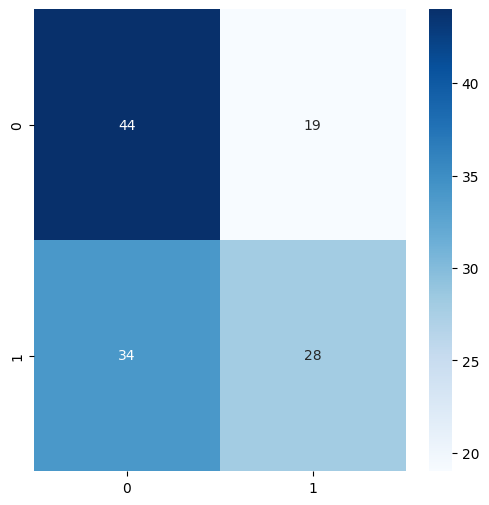

In [60]:
from sklearn.metrics import confusion_matrix, classification_report

# true_classes = [j.argmax() for j in y_test]
class_labels = ['MEL','NV']

confusionmatrix = confusion_matrix(true_classes, predicted_classes)
plt.figure(figsize = (6, 6))
sns.heatmap(confusionmatrix, cmap = 'Blues', annot = True, cbar = True)

print(classification_report(true_classes, predicted_classes))

In [61]:
def gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.input], [model.get_layer(last_conv_layer_name).output,  model.output]
    )
    
    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]
        
        
    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1))
    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output#[0]
    #print(np.expand_dims(last_conv_layer_output,axis=0))
    #print(pooled_grads[..., tf.newaxis])
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    
    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

In [62]:
def display_gradcam(img, heatmap, cam_path="cam.jpg", alpha=0.4,preds=[0,0], plot=None):

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

    # Save the superimposed image
    #superimposed_img.save(cam_path)

    # Display Grad CAM
    #display(Image(cam_path))
    #plt.figure(figsize=(8,8))
    plot.imshow(superimposed_img)
    plot.set(title ="Mel:{:.3f}\n Nev:{:.3f}\
      ".format(preds[0], preds[1]))
    plot.axis('off')
    #plt.show()

Predicted:
Mel: -0.19250933825969696
Nev: -1.5498648881912231 


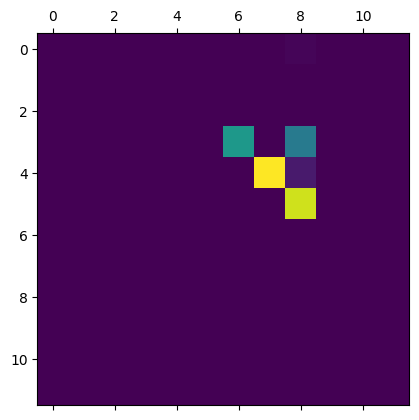

In [63]:
test_image = next(iter(test_loader))[0][5]
# Prepare image
img_array =get_img_array(test_image)

last_conv_layer_name = 'layer_normalization'
# Remove last layer's softmax
vit_classifier.layers[-1].activation = None
# Print what the top predicted class is
preds = vit_classifier.predict(img_array)
print("Predicted:\n" +"Mel: {p1}\nNev: {p2} ".format(p1=preds[0][0], \
                                            p2=preds[0][1]))
# Generate class activation heatmap
heatmap = gradcam_heatmap(img_array, vit_classifier, last_conv_layer_name)

heatmap = np.reshape(heatmap, (12,12))
# Display heatmap
plt.matshow(heatmap)

plt.show()

In [64]:
# fig, axis = plt.subplots(3, 2, figsize=(20, 20))
# for images, ax in zip(next(iter(test_loader))[0][12:19], axis.flat):
#     img_array =get_img_array(images)
#     # Remove last layer's softmax
#     vit_classifier.layers[-1].activation = None
#     # Print what the top predicted class is
#     preds = vit_classifier.predict(img_array)
#     heatmap = gradcam_heatmap(img_array, vit_classifier, last_conv_layer_name)

#     heatmap = np.reshape(heatmap, (12,12))
#     display_gradcam(images, heatmap, preds=preds[0], plot=ax)

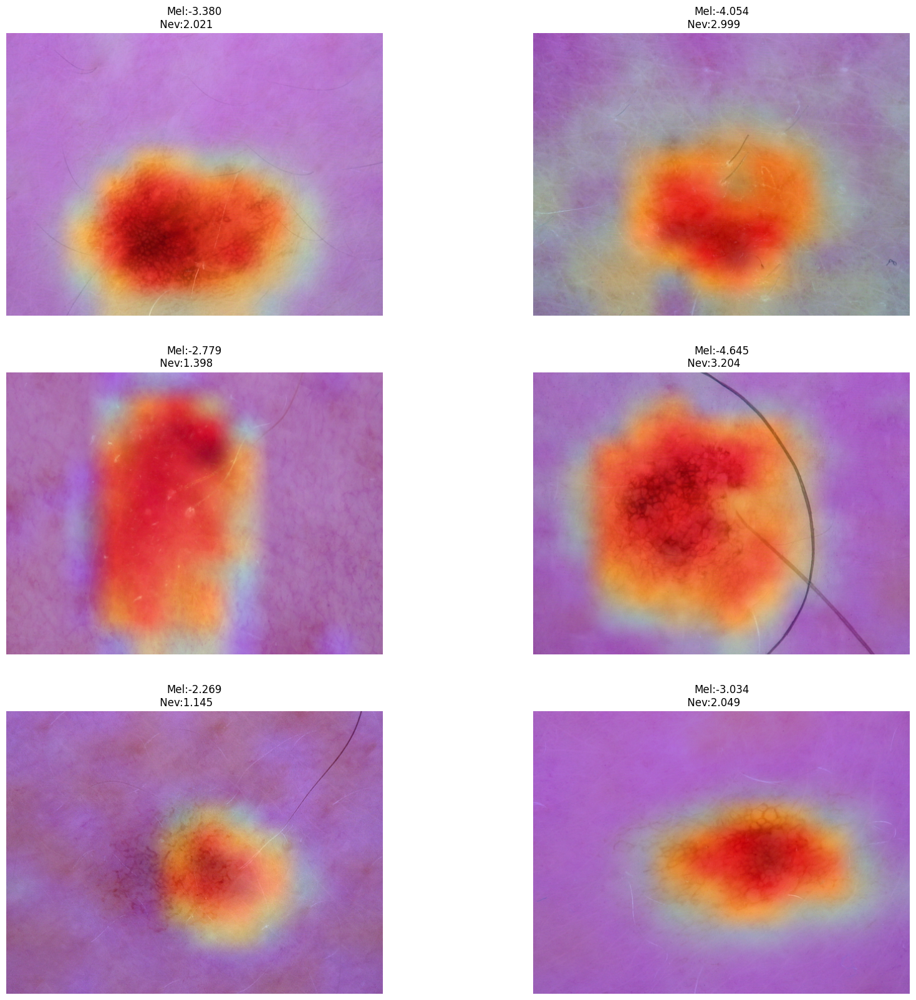

In [65]:
fig, axis = plt.subplots(3, 2, figsize=(20, 20))
display_count = 0  # Track the number of displayed images

# Iterate over the images in test_loader until we have 6 with positive predictions
for images in next(iter(test_loader))[0]:
    if display_count >= 6:  # Stop once we have 6 images
        break

    img_array = get_img_array(images)
    # Remove last layer's softmax
    vit_classifier.layers[-1].activation = None
    # Get the model's predictions
    preds = vit_classifier.predict(img_array)

    # Check if either prediction is positive
    if preds[0][0] > 0 or preds[0][1] > 0:
        # Generate and reshape the Grad-CAM heatmap
        heatmap = gradcam_heatmap(img_array, vit_classifier, last_conv_layer_name)
        heatmap = np.reshape(heatmap, (12, 12))
        
        # Display the Grad-CAM on the next available subplot
        ax = axis.flat[display_count]  # Get the next subplot in sequence
        display_gradcam(images, heatmap, preds=preds[0], plot=ax)
        
        display_count += 1  # Increment display counter

# Show the figure with Grad-CAM visualizations
plt.show()



In [66]:
# fig, axis = plt.subplots(6, 2, figsize=(12, 36))  # Create 6 rows and 2 columns for comparison view
# display_count = 0  # Track the number of displayed images

# # Iterate over the images in test_loader until we have 6 with positive predictions
# for images in next(iter(test_loader))[0]:
#     if display_count >= 6:  # Stop once we have 6 images
#         break

#     # Convert the TensorFlow tensor to a NumPy array for compatibility with matplotlib
#     original_image = images.numpy()  # Convert to NumPy
#     # Ensure that the shape is appropriate for grayscale or RGB (if needed)
#     if original_image.shape[-1] == 1:  # For grayscale images
#         original_image = np.squeeze(original_image, axis=-1)  # Remove the last dimension
#     elif original_image.shape[-1] == 3:
#         pass  # RGB images are fine as is

#     img_array = get_img_array(images)
#     # Remove last layer's softmax
#     vit_classifier.layers[-1].activation = None
#     # Get the model's predictions
#     preds = vit_classifier.predict(img_array)

#     # Check if either prediction is positive
#     if preds[0][0] > 0 or preds[0][1] > 0:
#         # Generate and reshape the Grad-CAM heatmap
#         heatmap = gradcam_heatmap(img_array, vit_classifier, last_conv_layer_name)
#         heatmap = np.reshape(heatmap, (12, 12))
        
#         # Plot the original image on the left
#         ax_orig = axis[display_count, 0]
#         ax_orig.imshow(original_image, cmap='gray')  # Display the original image
#         ax_orig.axis("off")
#         ax_orig.set_title("Original Image")

#         # Plot the Grad-CAM heatmap on the right
#         ax_cam = axis[display_count, 1]
#         display_gradcam(images, heatmap, preds=preds[0], plot=ax_cam)  # Display Grad-CAM overlay
#         ax_cam.axis("off")
#         ax_cam.set_title("Grad-CAM Heatmap")

#         display_count += 1  # Increment display counter

# # Show the figure with side-by-side comparisons
# plt.tight_layout()
# plt.show()


In [67]:
# fig, axis = plt.subplots(6, 2, figsize=(12, 36))  # Create 6 rows and 2 columns for comparison view
# display_count = 0  # Track the number of displayed images

# # Iterate over the images in test_loader until we have 6 with positive predictions
# for images in next(iter(test_loader))[0]:
#     if display_count >= 6:  # Stop once we have 6 images
#         break

#     # Convert the TensorFlow tensor to a NumPy array for compatibility with matplotlib
#     original_image = images.numpy()  # Convert to NumPy

#     # Rescale and convert data type if needed
#     if original_image.dtype == np.float32:
#         original_image = np.clip(original_image, 0, 1)  # Clip values to [0, 1] for float images
#     elif original_image.dtype == np.uint8:
#         original_image = np.clip(original_image, 0, 255)  # Clip values to [0, 255] for integer images

#     # Handle grayscale images
#     if original_image.shape[-1] == 1:  # For grayscale images
#         original_image = np.squeeze(original_image, axis=-1)  # Remove the last dimension

#     img_array = get_img_array(images)
#     # Remove last layer's softmax
#     vit_classifier.layers[-1].activation = None
#     # Get the model's predictions
#     preds = vit_classifier.predict(img_array)

#     # Check if either prediction is positive
#     if preds[0][0] > 0 or preds[0][1] > 0:
#         # Generate and reshape the Grad-CAM heatmap
#         heatmap = gradcam_heatmap(img_array, vit_classifier, last_conv_layer_name)
#         heatmap = np.reshape(heatmap, (12, 12))
        
#         # Plot the original image on the left
#         ax_orig = axis[display_count, 0]
#         ax_orig.imshow(original_image, cmap='gray')  # Display the original image
#         ax_orig.axis("off")
#         ax_orig.set_title("Original Image")

#         # Plot the Grad-CAM heatmap on the right
#         ax_cam = axis[display_count, 1]
#         display_gradcam(images, heatmap, preds=preds[0], plot=ax_cam)  # Display Grad-CAM overlay
#         ax_cam.axis("off")
#         ax_cam.set_title("Grad-CAM Heatmap")

#         display_count += 1  # Increment display counter

# # Show the figure with side-by-side comparisons
# plt.tight_layout()
# plt.show()


In [ ]:
# Get a single batch of images from test_loader
images = next(iter(test_loader))[0]

# Select one image to display (e.g., the 5th image)
# Scale the image to [0, 1] for display if it's in float32
original_image_scaled = original_image / 255.0  # Normalize to [0, 1]

# Display the image
plt.imshow(original_image_scaled, cmap='gray' if original_image.ndim == 2 else None)
plt.axis("off")
plt.title("Original Image (Scaled to [0, 1])")
plt.show()


# # Check the image shape and value range for debugging
# print("Image shape:", original_image.shape)
# print("Data type:", original_image.dtype)
# print("Min pixel value:", original_image.min())
# print("Max pixel value:", original_image.max())

# # Adjust image format if needed
# if original_image.shape[-1] == 1:  # Grayscale
#     original_image = np.squeeze(original_image, axis=-1)  # Remove last dimension
# elif original_image.shape[-1] == 3:  # RGB
#     pass  # RGB images are fine as is

# # Display the image
# plt.imshow(original_image, cmap='gray' if original_image.ndim == 2 else None)
# plt.axis("off")
# plt.title("Original Image")
# plt.show()


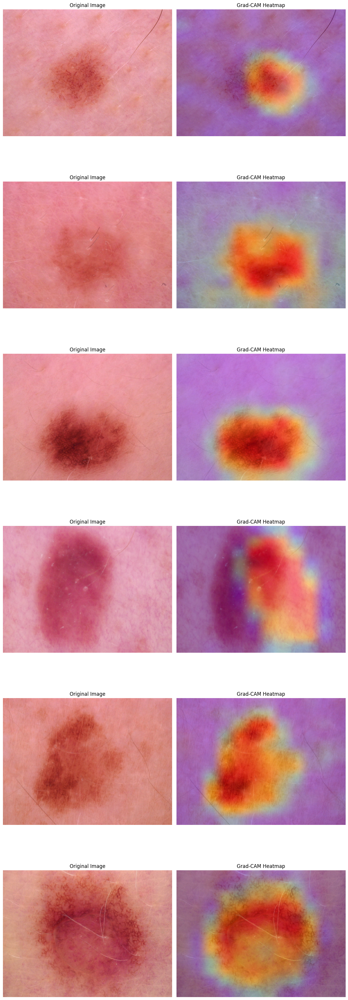

In [69]:
fig, axis = plt.subplots(6, 2, figsize=(12, 36))  # Create 6 rows and 2 columns for comparison view
display_count = 0  # Track the number of displayed images

# Iterate over the images in test_loader until we have 6 with positive predictions
for images in next(iter(test_loader))[0]:
    if display_count >= 6:  # Stop once we have 6 images
        break

    # Convert the TensorFlow tensor to a NumPy array for compatibility with matplotlib
    original_image = images.numpy()  # Convert to NumPy

    # Rescale and convert data type if needed
    if original_image.dtype == np.float32:
        original_image = np.clip(original_image, 0, 255)  # Clip values to [0, 255] for float images
        original_image = original_image / 255.0  # Normalize to [0, 1]
    elif original_image.dtype == np.uint8:
        original_image = np.clip(original_image, 0, 255)  # Clip values to [0, 255] for integer images

    # Handle grayscale images
    if original_image.shape[-1] == 1:  # For grayscale images
        original_image = np.squeeze(original_image, axis=-1)  # Remove the last dimension

    img_array = get_img_array(images)
    # Remove last layer's softmax
    vit_classifier.layers[-1].activation = None
    # Get the model's predictions
    preds = vit_classifier.predict(img_array)

    # Check if either prediction is positive
    if preds[0][0] > 0 or preds[0][1] > 0:
        # Generate and reshape the Grad-CAM heatmap
        heatmap = gradcam_heatmap(img_array, vit_classifier, last_conv_layer_name)
        heatmap = np.reshape(heatmap, (12, 12))
        
        # Plot the original image on the left
        ax_orig = axis[display_count, 0]
        ax_orig.imshow(original_image, cmap='gray' if original_image.ndim == 2 else None)  # Display the original image
        ax_orig.axis("off")
        ax_orig.set_title("Original Image")

        # Plot the Grad-CAM heatmap on the right
        ax_cam = axis[display_count, 1]
        display_gradcam(images, heatmap, preds=preds[0], plot=ax_cam)  # Display Grad-CAM overlay
        ax_cam.axis("off")
        ax_cam.set_title("Grad-CAM Heatmap")

        display_count += 1  # Increment display counter

# Show the figure with side-by-side comparisons
plt.tight_layout()
plt.show()


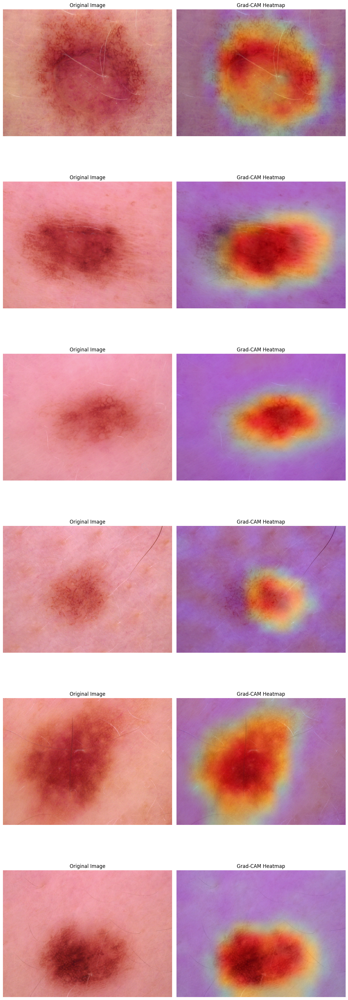

In [70]:
import random

# Create a list to hold all images from the test_loader
all_images = next(iter(test_loader))[0].numpy()  # Convert test_loader tensor to NumPy array

# Shuffle the indices of the images
random_indices = list(range(len(all_images)))
random.shuffle(random_indices)

fig, axis = plt.subplots(6, 2, figsize=(12, 36))  # Create 6 rows and 2 columns for comparison view
display_count = 0  # Track the number of displayed images

# Iterate over randomly shuffled indices
for idx in random_indices:
    if display_count >= 6:  # Stop once we have 6 images
        break

    images = all_images[idx]  # Select the image using the shuffled index

    # Convert the TensorFlow tensor to a NumPy array for compatibility with matplotlib
    original_image = images  # Already a NumPy array

    # Rescale and convert data type if needed
    if original_image.dtype == np.float32:
        original_image = np.clip(original_image, 0, 255)  # Clip values to [0, 255] for float images
        original_image = original_image / 255.0  # Normalize to [0, 1]
    elif original_image.dtype == np.uint8:
        original_image = np.clip(original_image, 0, 255)  # Clip values to [0, 255] for integer images

    # Handle grayscale images
    if original_image.shape[-1] == 1:  # For grayscale images
        original_image = np.squeeze(original_image, axis=-1)  # Remove the last dimension

    img_array = get_img_array(images)
    # Remove last layer's softmax
    vit_classifier.layers[-1].activation = None
    # Get the model's predictions
    preds = vit_classifier.predict(img_array)

    # Check if either prediction is positive
    if preds[0][0] > 0 or preds[0][1] > 0:
        # Generate and reshape the Grad-CAM heatmap
        heatmap = gradcam_heatmap(img_array, vit_classifier, last_conv_layer_name)
        heatmap = np.reshape(heatmap, (12, 12))
        
        # Plot the original image on the left
        ax_orig = axis[display_count, 0]
        ax_orig.imshow(original_image, cmap='gray' if original_image.ndim == 2 else None)  # Display the original image
        ax_orig.axis("off")
        ax_orig.set_title("Original Image")

        # Plot the Grad-CAM heatmap on the right
        ax_cam = axis[display_count, 1]
        display_gradcam(images, heatmap, preds=preds[0], plot=ax_cam)  # Display Grad-CAM overlay
        ax_cam.axis("off")
        ax_cam.set_title("Grad-CAM Heatmap")

        display_count += 1  # Increment display counter

# Show the figure with side-by-side comparisons
plt.tight_layout()
plt.show()
